In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn import metrics
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

In [54]:
data1 = pd.read_csv(r"C:\Users\Vanita\Downloads\datasetnew1code.csv")
data1

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9342,31-01-2023,78.95
9343,01-02-2023,76.34
9344,02-02-2023,75.87
9345,03-02-2023,73.40


In [55]:
len(data1['Price'].unique())

5238

In [56]:
data1[data1.duplicated()].head()

,Date,Price


In [57]:
data1['Date']=pd.to_datetime(data1['Date'],dayfirst=True)
data1.head(30)

,Date,Price
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
5,1986-01-09,26.03
6,1986-01-10,25.65
7,1986-01-13,25.08
8,1986-01-14,24.97
9,1986-01-15,25.18


In [58]:
data1['month']= data1['Date'].dt.month
data1['year']= data1['Date'].dt.year
data1.head(50)

,Date,Price,month,year
0,1986-01-02,25.56,1,1986
1,1986-01-03,26.00,1,1986
2,1986-01-06,26.53,1,1986
3,1986-01-07,25.85,1,1986
4,1986-01-08,25.87,1,1986
5,1986-01-09,26.03,1,1986
6,1986-01-10,25.65,1,1986
7,1986-01-13,25.08,1,1986
8,1986-01-14,24.97,1,1986
9,1986-01-15,25.18,1,1986


# Datetime index

In [59]:
print(data1['year'].unique())
len(data1['year'].unique())

[1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999
 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023]


38

# Visualization

<AxesSubplot:>

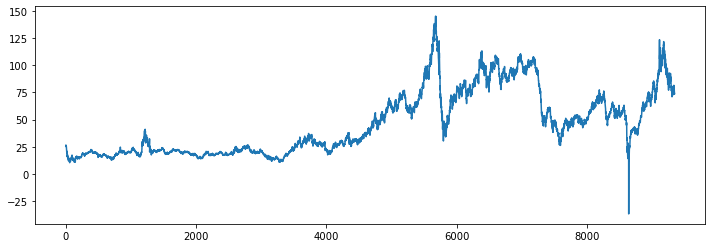

In [60]:
data1['Price'].plot(figsize=(12,4))

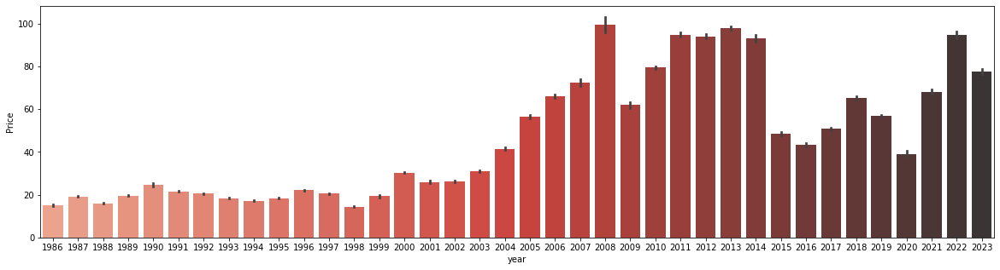

In [61]:
f, axe = plt.subplots(1,1, figsize=(20,5))
sns.barplot(x='year', y='Price', data=data1, ax = axe, palette='Reds_d')
plt.show()

In [62]:
'''fig, ax = plt.subplots(1,1, figsize=(20,5))
data1['year'].plot(kind='bar', color='red')
data1['Price'].plot(kind='line', marker='.', color='black', ms=10)
plt.show()'''

"fig, ax = plt.subplots(1,1, figsize=(20,5))\ndata1['year'].plot(kind='bar', color='red')\ndata1['Price'].plot(kind='line', marker='.', color='black', ms=10)\nplt.show()"

In [63]:
#drop column

In [64]:
data1=data1.iloc[:,0:2]
data1

,Date,Price
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
...,...,...
9342,2023-01-31,78.95
9343,2023-02-01,76.34
9344,2023-02-02,75.87
9345,2023-02-03,73.40


In [65]:
data1=data1.set_index('Date')
data1

,Price
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2023-01-31,78.95
2023-02-01,76.34
2023-02-02,75.87


# Moving Average

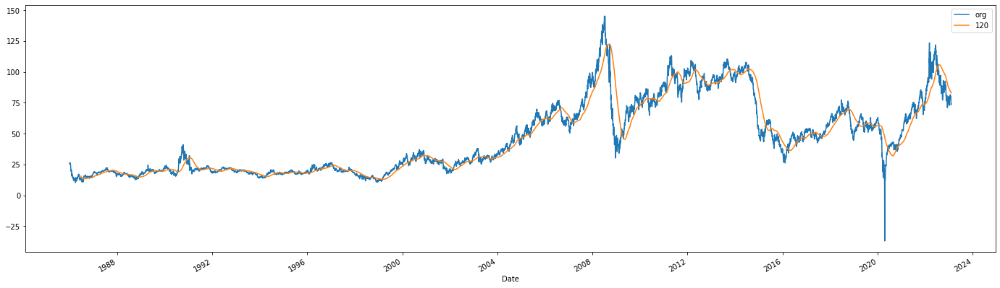

In [66]:
plt.figure(figsize=(24,7))
data1['Price'].plot(label="org")
a=[120]
for i in a:
    data1['Price'].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

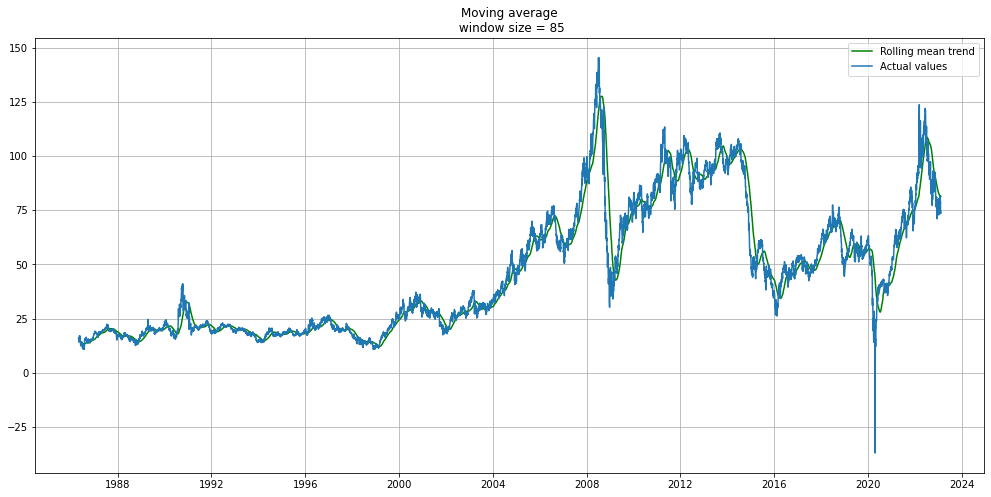

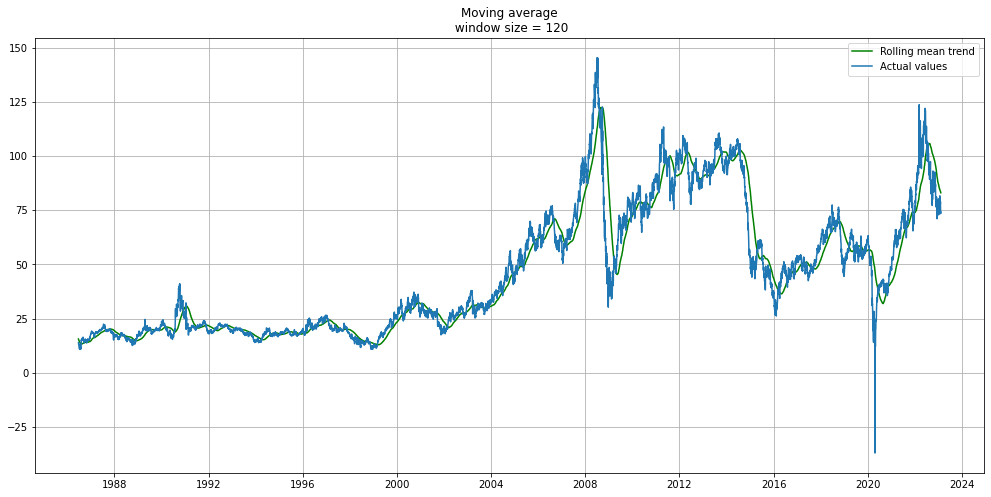

In [67]:
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window=window).mean()
    
    plt.figure(figsize=(17,8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')
    
    #Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
            
    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)
    
#Smooth by the previous 5 days (by week)
plot_moving_average(data1['Price'], 85)
plot_moving_average(data1['Price'], 120)

In [68]:
'''As you can see, we can hardly see a trend, because it is too close to actual curve. Let’s see the result of smoothing by the previous month, and previous quarter.
Trends are easier to spot now. Notice how the 30-day and 90-day trend show a downward curve at the end. This might mean that the stock is likely to go down in the following days.'''

'As you can see, we can hardly see a trend, because it is too close to actual curve. Let’s see the result of smoothing by the previous month, and previous quarter.\nTrends are easier to spot now. Notice how the 30-day and 90-day trend show a downward curve at the end. This might mean that the stock is likely to go down in the following days.'

# Decomposition plot

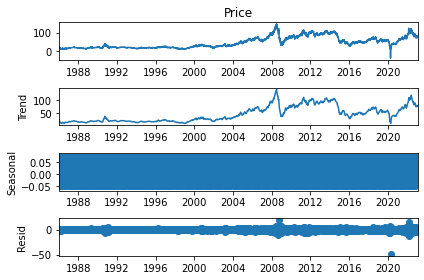

In [69]:
decom_plt = seasonal_decompose(data1.Price,period=12)
decom_plt.plot()
plt.show()

# ACF plots and PACF plots

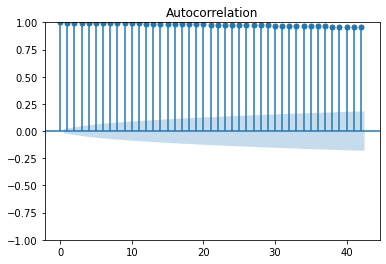

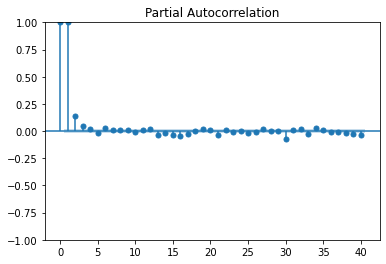

In [70]:
import statsmodels.graphics.tsaplots as tsa_plots
tsa_plots.plot_acf(data1.Price,lags=42)
tsa_plots.plot_pacf(data1.Price)
plt.show()

In [71]:
data1.head(7478)

,Price
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2015-08-18,42.58
2015-08-19,40.75
2015-08-20,41.00


# train test

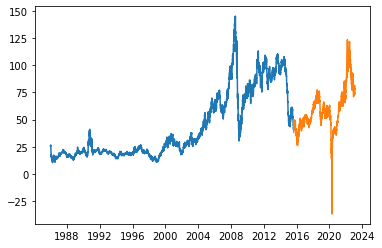

In [72]:
df_train = data1.loc['1986-01-02':'2015-08-21']
df_test = data1.loc['2015-08-24':]
plt.plot(df_train)
plt.plot(df_test)

In [73]:
len(df_train)
len(df_test)

1870

In [74]:
df_train
df_test

,Price
Date,
2015-08-24,38.22
2015-08-25,39.15
2015-08-26,38.50
2015-08-27,42.47
2015-08-28,45.29
...,...
2023-01-31,78.95
2023-02-01,76.34
2023-02-02,75.87


# ADF test

In [75]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(df_train)
print(f'p-value: {adf_test[1]}')

p-value: 0.3240882261484357


<AxesSubplot:xlabel='Date'>

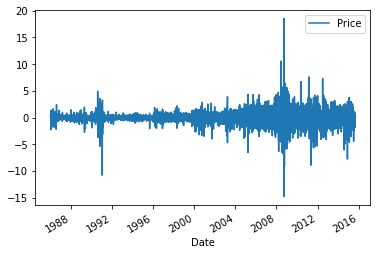

In [76]:
df_train_diff = df_train.diff().dropna()
df_train_diff.plot()

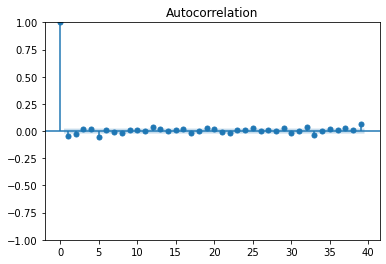

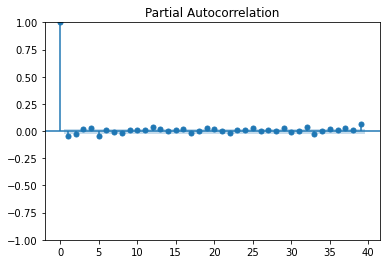

In [77]:
acf_diff = plot_acf(df_train_diff)

pacf_diff = plot_pacf(df_train_diff)

In [78]:
adf_test = adfuller(df_train_diff)
print(f'p-value: {adf_test[1]}')

p-value: 3.0771347146548065e-22


# Simple Exponential smoothing 

In [79]:
ses_model = SimpleExpSmoothing(df_train["Price"]).fit(smoothing_level=0.1)
pred_ses = ses_model.predict(start = 7478,end = 9347)

In [80]:
mae_ses = mean_absolute_error(df_test, pred_ses)
mape_ses = mean_absolute_percentage_error(df_test, pred_ses)
rmse_ses = np.sqrt(mean_squared_error(df_test, pred_ses))

print(f'mae: {mae_ses}')
print(f'mape: {mape_ses}')
print(f'rmse: {rmse_ses}')
df_test.mean()

mae: 17.975391619715495
mape: 0.27796381978389867
rmse: 24.371751543678446


Price    59.167797
dtype: float64

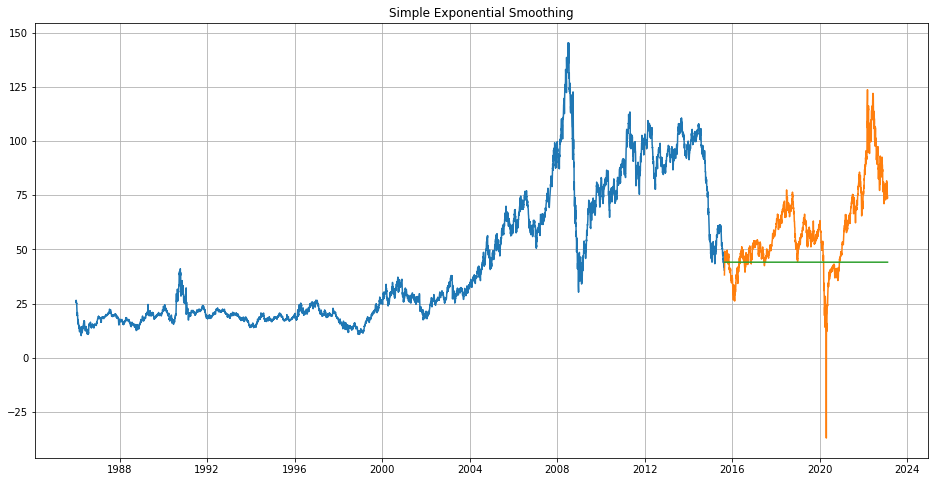

In [81]:
plt.figure(figsize=(16,8))
plt.grid()
plt.plot(df_train.index, df_train['Price'], label = 'Train')
plt.plot(df_test.index, df_test['Price'],   label = 'Test')
plt.plot(df_test.index, pred_ses,   label = 'SES Forecast')
plt.title('Simple Exponential Smoothing')
plt.show()

# Arima

In [82]:
!pip install pmdarima
import pmdarima
from pmdarima import auto_arima
stepwise_fit = auto_arima(data1['Price'], trace=True,
suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=33483.851, Time=6.73 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=33673.024, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=33504.151, Time=0.87 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=33488.217, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=33671.141, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=33481.783, Time=4.97 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=33479.908, Time=1.72 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=33481.742, Time=1.89 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=33479.884, Time=2.78 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=33481.813, Time=2.06 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=33481.865, Time=1.55 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=33478.063, Time=1.32 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=33486.381, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=33502.304, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0

In [83]:
stepwise_fit.fit(df_train)

ARIMA(order=(1, 1, 1), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [84]:
arima_forecast = stepwise_fit.predict(n_periods=1870)
#print(arima_forecast)
arima_forecast.index=data1.index[len(df_train):len(df_train)+len(df_test)-1+1]
arima_forecast

Date
2015-08-24    40.480369
2015-08-25    40.488091
2015-08-26    40.490054
2015-08-27    40.490553
2015-08-28    40.490680
                ...    
2023-01-31    40.490724
2023-02-01    40.490724
2023-02-02    40.490724
2023-02-03    40.490724
2023-02-06    40.490724
Length: 1870, dtype: float64

In [85]:
arima_forecast

Date
2015-08-24    40.480369
2015-08-25    40.488091
2015-08-26    40.490054
2015-08-27    40.490553
2015-08-28    40.490680
                ...    
2023-01-31    40.490724
2023-02-01    40.490724
2023-02-02    40.490724
2023-02-03    40.490724
2023-02-06    40.490724
Length: 1870, dtype: float64

In [86]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

arima_mae = mean_absolute_error(df_test, arima_forecast)
arima_mape = mean_absolute_percentage_error(df_test, arima_forecast)
arima_rmse = np.sqrt(mean_squared_error(df_test, arima_forecast))

print(f'mae: {arima_mae}')
print(f'mape: {arima_mape}')
print(f'rmse: {arima_rmse}')
df_test.mean()

mae: 20.470017026825857
mape: 0.31200426391972985
rmse: 26.754561842043888


Price    59.167797
dtype: float64

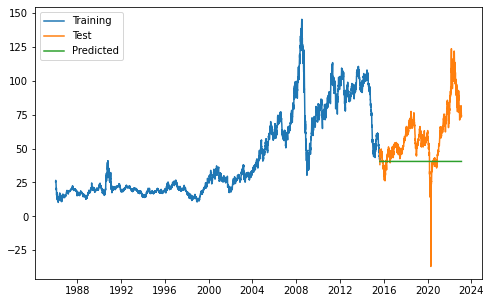

In [87]:
plt.figure(figsize=(8,5))
plt.plot(df_train,label="Training")
plt.plot(df_test,label="Test")
plt.plot(arima_forecast,label="Predicted")
plt.legend(loc = 'upper left')
plt.savefig('SecondPrection.jpg')
plt.show()

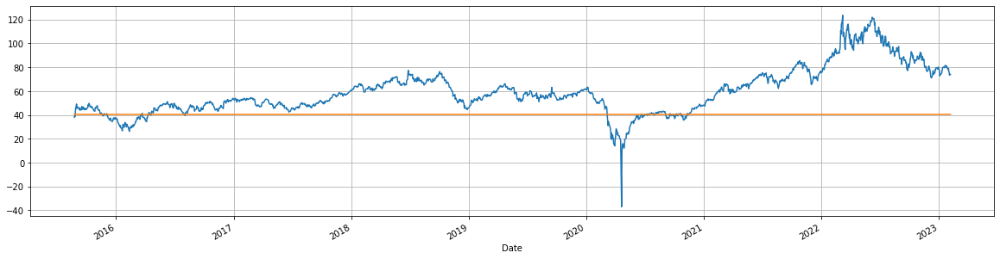

In [88]:
df_test['Price'].plot(figsize=(20,5))
plt.plot(arima_forecast)
plt.grid()

# Model Building

# Using Prophet

In [125]:
!pip install prophet

In [126]:
from prophet import Prophet

In [127]:
df=data1.reset_index('Date')
df=df[["Date","Price"]]
df

,Date,Price
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
...,...,...
9342,2023-01-31,78.95
9343,2023-02-01,76.34
9344,2023-02-02,75.87
9345,2023-02-03,73.40


In [128]:
df.columns = ['ds','y']
df

,ds,y
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
...,...,...
9342,2023-01-31,78.95
9343,2023-02-01,76.34
9344,2023-02-02,75.87
9345,2023-02-03,73.40


In [129]:

train = df.iloc[:len(df)-365]
test = df.iloc[len(df)-365:]
train
test

,ds,y
8982,2021-08-24,67.50
8983,2021-08-25,68.54
8984,2021-08-26,67.42
8985,2021-08-27,68.84
8986,2021-08-30,69.28
...,...,...
9342,2023-01-31,78.95
9343,2023-02-01,76.34
9344,2023-02-02,75.87
9345,2023-02-03,73.40


In [96]:
m = Prophet()
m.fit(train)
future = m.make_future_dataframe(periods=365) #MS for monthly, H for hourly
forecast = m.predict(future)

22:20:19 - cmdstanpy - INFO - Chain [1] start processing
22:20:30 - cmdstanpy - INFO - Chain [1] done processing


In [97]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
9342,2022-08-19,43.506721,28.116557,57.556367,41.547519,45.558891,-0.373627,-0.373627,-0.373627,-1.642059,-1.642059,-1.642059,1.268432,1.268432,1.268432,0.0,0.0,0.0,43.133093
9343,2022-08-20,43.497578,33.570071,64.200852,41.531285,45.566250,5.454958,5.454958,5.454958,4.221546,4.221546,4.221546,1.233412,1.233412,1.233412,0.0,0.0,0.0,48.952536
9344,2022-08-21,43.488434,33.021075,62.779961,41.515052,45.573184,5.421659,5.421659,5.421659,4.221538,4.221538,4.221538,1.200121,1.200121,1.200121,0.0,0.0,0.0,48.910094
9345,2022-08-22,43.479291,28.709628,57.652832,41.498819,45.573534,-0.525688,-0.525688,-0.525688,-1.694497,-1.694497,-1.694497,1.168809,1.168809,1.168809,0.0,0.0,0.0,42.953603
9346,2022-08-23,43.470148,27.385935,57.030747,41.482585,45.568383,-0.596230,-0.596230,-0.596230,-1.735903,-1.735903,-1.735903,1.139674,1.139674,1.139674,0.0,0.0,0.0,42.873919


In [98]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
9342,2022-08-19,43.133093,28.116557,57.556367
9343,2022-08-20,48.952536,33.570071,64.200852
9344,2022-08-21,48.910094,33.021075,62.779961
9345,2022-08-22,42.953603,28.709628,57.652832
9346,2022-08-23,42.873919,27.385935,57.030747


In [99]:

test.tail()

,ds,y
9342,2023-01-31,78.95
9343,2023-02-01,76.34
9344,2023-02-02,75.87
9345,2023-02-03,73.40
9346,2023-02-06,74.11


# FB PROPHET VISUALIZATION

In [100]:

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m ,forecast)

In [101]:
plot_components_plotly(m, forecast)

In [102]:
from sklearn.metrics import mean_absolute_error

In [103]:

fp_mae = mean_absolute_error(df['y'], forecast['yhat'])
fp_mape = mean_absolute_percentage_error(df['y'], forecast['yhat'])
fp_rmse = np.sqrt(mean_squared_error(df['y'], forecast['yhat']))

print(f'mae: {fp_mae}')
print(f'mape: {fp_mape}')
print(f'rmse: {fp_rmse}')

mae: 8.729056497416526
mape: 0.18400604188389094
rmse: 14.328956065859247


In [104]:
df['y'].mean()

46.11633786241565

# LSTM

In [105]:
df_train
df_test

,Price
Date,
2015-08-24,38.22
2015-08-25,39.15
2015-08-26,38.50
2015-08-27,42.47
2015-08-28,45.29
...,...
2023-01-31,78.95
2023-02-01,76.34
2023-02-02,75.87


In [106]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [107]:
data1.head()

,Price
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [108]:
'''data1=data1.drop(['forecast'],axis=1)
data1'''

"data1=data1.drop(['forecast'],axis=1)\ndata1"

In [109]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [110]:
sc = MinMaxScaler(feature_range = (0, 1))
data = sc.fit_transform(data1)

In [111]:
train_data, test_data = data[0:int(len(data)*0.8), :], data[int(len(data)*0.8):len(data), :]

In [112]:
def prepre_dataset( dataset, window ):
    data, label =[],[]
    for i in range( len(dataset) - window - 1 ):
        d = dataset[ i:( i+window ), 0 ]
        data.append(d)
        label.append(dataset[i+window,0])
    return np.array(data), np.array(label)

In [113]:
train_x, train_y = prepre_dataset(train_data,90)
test_x, test_y = prepre_dataset(test_data,90)
train_x = np.reshape(train_x, (train_x.shape[0], train_x.shape[1],1))
test_x = np.reshape(test_x, (test_x.shape[0], test_x.shape[1],1))

In [114]:
test_y.shape

(1779,)

In [115]:
print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(7386, 90, 1)
(7386,)
(1779, 90, 1)
(1779,)


In [116]:
import tensorflow as tf 
#from keras.layers.recurrent import LSTM
from keras.models import Sequential

In [117]:
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.LSTM(units = 100, input_shape = (train_x.shape[1], 1)))
model.add(tf.keras.layers.Dense(units = 1))
model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [118]:
history = model.fit(train_x, train_y, epochs = 10, batch_size = 15, validation_data = (test_x, test_y), verbose =1)

Epoch 1/10
493/493 [==============================] - 38s 62ms/step - loss: 0.0030 - val_loss: 3.9429e-04
Epoch 2/10
493/493 [==============================] - 29s 59ms/step - loss: 1.8115e-04 - val_loss: 4.0534e-04
Epoch 3/10
493/493 [==============================] - 61s 124ms/step - loss: 1.5907e-04 - val_loss: 3.1351e-04
Epoch 4/10
493/493 [==============================] - 26s 52ms/step - loss: 1.4284e-04 - val_loss: 3.2012e-04
Epoch 5/10
493/493 [==============================] - 31s 62ms/step - loss: 1.2860e-04 - val_loss: 2.9115e-04
Epoch 6/10
493/493 [==============================] - 26s 54ms/step - loss: 1.2349e-04 - val_loss: 2.6166e-04
Epoch 7/10
493/493 [==============================] - 27s 55ms/step - loss: 1.1753e-04 - val_loss: 2.7757e-04
Epoch 8/10
493/493 [==============================] - 26s 53ms/step - loss: 9.8672e-05 - val_loss: 2.3341e-04
Epoch 9/10
493/493 [==============================] - 26s 53ms/step - loss: 9.2317e-05 - val_loss: 2.0800e-04
Epoch 10/10
4

In [119]:
test_predict = model.predict(test_x)
test_predict.shape

(1779, 1)

In [120]:
lstm_mae = mean_absolute_error(test_y, test_predict)
lstm_mape = mean_absolute_percentage_error(test_y, test_predict)
lstm_rmse = np.sqrt(mean_squared_error(test_y, test_predict))

print(f'mae: {lstm_mae}')
print(f'mape: {lstm_mape}')
print(f'rmse: {lstm_rmse}')

mae: 0.00895411975201943
mape: 780645765481.4961
rmse: 0.014274123662080869


In [121]:
test_predict = sc.inverse_transform(test_predict)
test_y = sc.inverse_transform([test_y])

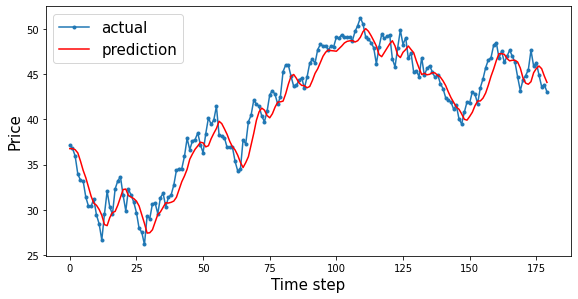

In [122]:
aa=[x for x in range(180)]
plt.figure(figsize=(8,4))
plt.plot(aa, test_y[0][:180], marker='.', label="actual")
plt.plot(aa, test_predict[:,0][:180], 'r', label="prediction")
plt.tight_layout()
plt.subplots_adjust(left=0.07)
plt.ylabel('Price', size=15)
plt.xlabel('Time step', size=15)
plt.legend(fontsize=15)
plt.show();

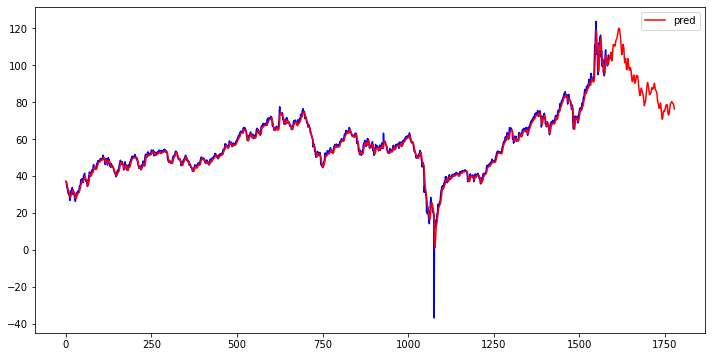

In [123]:
plt.figure(figsize=(12,6))
#df_test['Price'].plot(figsize=(20,5))
plt.plot(test_y[0][:1587],'b',)
plt.plot(test_predict,'r',label='pred')
#plt.grid()
plt.legend()
plt.show()

# Compare Result

In [124]:
Evaluation = {"Models":pd.Series(["Simple Exponential Method","Arima","FbProphet","Lstm"]),\
        "Test_MAPE(%)":pd.Series([mape_ses,arima_mape,fp_mape,lstm_mape]),\
        "Test_RMSE_Values":pd.Series([rmse_ses,arima_rmse,fp_rmse,lstm_rmse,])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['Test_MAPE(%)'], inplace=True, ignore_index=True)
table_evaluation

,Models,Test_MAPE(%),Test_RMSE_Values
0,FbProphet,1.840060e-01,14.328956
1,Simple Exponential Method,2.779638e-01,24.371752
2,Arima,3.120043e-01,26.754562
3,Lstm,7.806458e+11,0.014274
